In [102]:
%reset -f
%matplotlib inline

import os
import numpy as np
import pandas as pd
import random
import math
from math import e

import configparser

#para las gráficas
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
from matplotlib.ticker import FuncFormatter
#para que las muestre
import pylab as pl
from IPython import display


In [103]:
# lectura de datos
    
def load_data():
    """Lee los datos del directorio de trabajo.
    """
    global pathoutput
    global nodos, inv, vu, cartectraf
    global HSCD, PVDT, TNTR, TAMB, PDRE, FCMX, FCPR, HVUT, AVUT
    global P1FVAC1, P1FVAC2, P1FCAR1, P1FCAR2, P1FCAR3, P1FCAR4
    global P3FVAC11, P3FVAC12, P3FVAC21, P3FVAC22, P3FVAC31, P3FVAC32
    global P3FCAR11, P3FCAR12, P3FCAR13, P3FCAR21, P3FCAR22, P3FCAR31, P3FCAR32

    ## definicion del archivo txt donde estan los parametros
    parser = configparser.ConfigParser()
    parser.read(working_dir + 'input/params.txt')

    ## parametros globales
    HSCD = float(parser['CALCULOS']['horas_sobrecarga_dia'])
    PVDT = float(parser['CALCULOS']['perdida_vida_diaria_teorica'])
    TNTR = float(parser['CALCULOS']['temperatura_normal_trafo'])
    TAMB = float(parser['CALCULOS']['temperatura_ambiente'])
    PDRE = float(parser['CALCULOS']['probabilidad_deterioro_reubicacion'])
    FCMX = float(parser['CALCULOS']['factor_carga_maxima'])
    FCPR = float(parser['CALCULOS']['factor_carga_promedio'])

    ## calculos con parametros globales
    HVUT = 24 / PVDT
    AVUT = HVUT / (24*365) 

    ##
    ## Resoluciones 818 y 819
    ##

    ##    Transformadores monofasicos - Perdidas en vacio
    ##
    P1FVAC1 = float(parser['RES818819']['P1FVAC1'])
    P1FVAC2 = float(parser['RES818819']['P1FVAC2'])

    ##
    ##    Transformadores monofasicos - Perdidas con carga
    ##        
    P1FCAR1 = float(parser['RES818819']['P1FCAR1'])
    P1FCAR2 = float(parser['RES818819']['P1FCAR2'])
    P1FCAR3 = float(parser['RES818819']['P1FCAR3'])
    P1FCAR4 = float(parser['RES818819']['P1FCAR4'])

    ##
    ##    Transformadores trifasicos -- Perdidas en vacio
    ##
    P3FVAC11 = float(parser['RES818819']['P3FVAC11'])
    P3FVAC12 = float(parser['RES818819']['P3FVAC12'])
    P3FVAC21 = float(parser['RES818819']['P3FVAC21'])
    P3FVAC22 = float(parser['RES818819']['P3FVAC22'])
    P3FVAC31 = float(parser['RES818819']['P3FVAC31'])
    P3FVAC32 = float(parser['RES818819']['P3FVAC32'])

    ##
    ##    Transformadores trifasicos - Perdidas con carga
    ##        
    P3FCAR11 = float(parser['RES818819']['P3FCAR11'])
    P3FCAR12 = float(parser['RES818819']['P3FCAR12'])
    P3FCAR13 = float(parser['RES818819']['P3FCAR13'])
    P3FCAR21 = float(parser['RES818819']['P3FCAR21'])
    P3FCAR22 = float(parser['RES818819']['P3FCAR22'])
    P3FCAR31 = float(parser['RES818819']['P3FCAR31'])
    P3FCAR32 = float(parser['RES818819']['P3FCAR32'])

    ##
    ## tablas de datos
    ##
    nodos = pd.read_csv(working_dir + "input/nodos.csv", sep=',', decimal='.')
    inv = pd.read_csv(working_dir + "input/inventario_transformadores.csv", sep=',', decimal='.')
    cartectraf = pd.read_csv(working_dir + "input/carac_tecn_transf.csv", sep=',', decimal='.')
    vu = pd.read_csv(working_dir + "input/vida_util.csv", sep=',', decimal='.')

    ##
    ## nombres de las columnas de las tablas de datos
    ##
    nodos.columns = ['id_n', 'id_n_Internexa','lat','lon','tension','cpro_n','cmax_n','cremcreg','dmda_n','cens','cred','tusu','pkwh_n']
    inv.columns = ['id_t', 'id_t_Internexa','fab','fase_t','tais','capa_t','vprim','vsecu','ffab','anus','viut_t','id_n_Internexa','tacr_t','creu_t','finst']
    vu.columns = ['tgrc', 'fase_t','lipo','lspo','cpre','dura','cpor','tmpc','tmac']
    cartectraf.columns = ['fase_t', 'capa_t','cnue_t']

    ## 
    ## adecuacion de las tablas para facilidad en calculos
    ##
    inv = inv.merge(nodos[['id_n','id_n_Internexa']], on = 'id_n_Internexa',how = 'left')

    ## calcular carga maxima y carga promedio de los nodos
    #nodos['cpro_n'] = nodos['dmda_n'] / 30 * FCPR
    #nodos['cmax_n'] = nodos['dmda_n'] / 30 * FCMX
    nodos.loc[nodos['cpro_n'].isnull(),'cpro_n'] = nodos['dmda_n'] / 30 * FCPR
    nodos.loc[nodos['cmax_n'].isnull(),'cmax_n'] = nodos['dmda_n'] / 30 * FCMX

    ## indicar grupo del trafo para calculo de las perdidas de transformacion
    inv['grpt_t'] = 1
    inv.loc[(inv.fase_t == 3) & (inv.capa_t >= 150), 'grpt_t'] = 2
    inv.loc[(inv.fase_t == 3) & (inv.capa_t >= 800), 'grpt_t'] = 3

    ## indicar grupo del trafo para calculo de las perdidas de vida util
    inv['grpv_t'] = 1
    inv.loc[(inv.fase_t == 1) & (inv.capa_t > 50), 'grpv_t'] = 2
    inv.loc[(inv.fase_t == 3) & (inv.capa_t >= 150), 'grpv_t'] = 2
    inv.loc[(inv.fase_t == 3) & (inv.capa_t >= 500), 'grpv_t'] = 3

    ## calcular vida util restante del trafo en meses
    inv['viut_t'] = AVUT
    inv['viur_t'] = (inv.viut_t - inv.anus) * 12
    inv.loc[inv.viur_t < 0, 'viur_t'] = 1

    ## indicar grupo de vida util
    vu['grpv_t'] = 1
    vu.loc[(vu.fase_t == 1) & (vu.lipo >= 50), 'grpv_t'] = 2
    vu.loc[(vu.fase_t == 3) & (vu.lipo >= 150),'grpv_t'] = 2
    vu.loc[(vu.fase_t == 3) & (vu.lipo >= 500), 'grpv_t'] = 3

    ## armar keys para busquedas
    cartectraf['faca'] = cartectraf.fase_t.map(str) + "-" + cartectraf.capa_t.map(str)
    vu['tfcg'] = vu.tgrc.map(str) + "-" + vu.fase_t.map(str) + "-" + vu.cpre.map(str) + "-" + vu['grpv_t'].map(str)
    
    ## calculo del costo de cada KVA instalado en la bodega en la solucion inicial
    inv2=inv.copy()
    inv2['faca'] = inv2.fase_t.map(str) + "-" + inv2.capa_t.map(str)
    inv2 = inv2.merge(cartectraf[['cnue_t','faca']], on = 'faca',how = 'left')
    totalcap = inv2['capa_t'].sum()
    totalvalor = inv2['cnue_t'].sum()
    precioKVAbod = int(totalvalor / totalcap)

In [134]:
def bodega():
    """Calcula la bodega.
    """  
    # precio del VA en bodega
    inv2=inv.copy()
    inv2['faca'] = inv2.fase_t.map(str) + "-" + inv2.capa_t.map(str)
    inv2 = inv2.merge(cartectraf[['cnue_t','faca']], on = 'faca',how = 'left')
    totalcap = inv2['capa_t'].sum()
    totalvalor = inv2['cnue_t'].sum()
    precioKVAbod = int(totalvalor / totalcap)

    # calculo de la capacidad liberada y valoracion
    bodini = solinicial[solinicial.id_n == 999999]
    bodfin = solfin[solfin.id_n == 999999]
    capbodini = bodini['capa_t'].sum()
    tfbodini = bodini['capa_t'].count()
    capbodfin = bodfin['capa_t'].sum()
    tfbodfin = bodfin['capa_t'].count()
    caplib = capbodfin - capbodini
    valorlib = int(caplib * precioKVAbod)
    return (capbodini,capbodfin,caplib,valorlib)

In [105]:
def Merge(sol):
    sol = sol.merge(nodos[['id_n','cmax_n','pkwh_n','cpro_n']], on='id_n', how='left')
    sol = sol.merge(inv[['id_t','capa_t','grpt_t','fase_t','viur_t','grpv_t','creu_t']], on='id_t', how='left')
    sol['faca'] = sol.fase_t.map(str) + "-" + sol.capa_t.map(str)
    sol = sol.merge(cartectraf[['faca','cnue_t']], on='faca', how='left')
    
    #inicializaciones en cero:
    sol['cpt_nt']=0; sol['cpfe_nt']=0; sol['cpcu_nt']=0; sol['futi_nt']=0; sol['pfeW']=0; sol['pcuW']=0; sol['ptrW']=0;
    sol['pnvac']=0; sol['pncar']=0; sol['cperm']=0; sol['cdete']=0; sol['resta']=0; sol['restaiter']=0
    sol['cvu_nt']=0; sol['viur_r']=0
    sol['key'] = 0

    #identificar los movimientos de esta solucion respecto a la inicial
    sol['resta'] = sol['id_t'] - solini['id_t']

    return sol

In [106]:
def CostoOperSol(sol):
    sol.loc[((sol.id_n != 999999) & (sol.fase_t == 1)), 'pnvac'] = P1FVAC1 * sol['capa_t'] ** P1FVAC2    
    sol.loc[((sol.id_n != 999999) & (sol.fase_t == 1)), 'pncar'] = P1FCAR1 * sol['capa_t'] ** 3 + P1FCAR2 * sol['capa_t'] ** 2 + P1FCAR3 * sol['capa_t'] + P1FCAR4
    sol.loc[((sol.id_n != 999999) & (sol.fase_t == 3) & (sol.grpt_t == 1)), 'pnvac'] = P3FVAC11 * sol['capa_t'] ** P3FVAC12
    sol.loc[((sol.id_n != 999999) & (sol.fase_t == 3) & (sol.grpt_t == 1)), 'pncar'] = P3FCAR11 * sol['capa_t'] ** 2 + P3FCAR12 * sol['capa_t'] + P3FCAR13
    sol.loc[((sol.id_n != 999999) & (sol.fase_t == 3) & (sol.grpt_t == 2)), 'pnvac'] = P3FVAC21 * sol['capa_t'] ** P3FVAC22
    sol.loc[((sol.id_n != 999999) & (sol.fase_t == 3) & (sol.grpt_t == 2)), 'pncar'] = P3FCAR21 * sol['capa_t'] + P3FCAR22
    sol.loc[((sol.id_n != 999999) & (sol.fase_t == 3) & (sol.grpt_t == 3)), 'pnvac'] = P3FVAC31 * sol['capa_t'] ** P3FVAC32
    sol.loc[((sol.id_n != 999999) & (sol.fase_t == 3) & (sol.grpt_t == 3)), 'pncar'] = P3FCAR31 * sol['capa_t'] + P3FCAR32
    
    # calculo de perdidas en hoterro y cobre, en unidades W
    sol.loc[(sol.id_n != 999999),'futi_nt'] = sol['cmax_n']/sol['capa_t']
    sol.loc[(sol.id_n != 999999),'pfeW'] = sol['pnvac']
    sol.loc[(sol.id_n != 999999),'pcuW'] = sol['pncar'] * sol['futi_nt'] ** 2
    sol.loc[(sol.id_n != 999999),'ptrW'] = sol['pfeW'] + sol['pcuW']
    
    # monetizacion de las perdidas
    sol.loc[(sol.id_n != 999999),'cpfe_nt'] = sol['pfeW'] / 1000 * sol['pkwh_n'] * 24 * 30 * sol['viur_t'] / sol['viur_t']
    sol.loc[(sol.id_n != 999999),'cpcu_nt'] = sol['pcuW'] / 1000 * sol['pkwh_n'] * 24 * 30 * sol['viur_t'] / sol['viur_t']
    sol['cpt_nt'] = sol['cpfe_nt'] + sol['cpcu_nt']

    return sol


In [107]:
def teta(sol):
    sol['key'] = str(int(TAMB)) + '-' + sol.fase_t.map(str) + '-' + sol.cpre_nt.map(str) + '-' + sol['grpv_t'].map(str)
    
    #asignacion para la primera iteracion
    if parejaseval == 0: sol['theta']=0
            
    for i in range(sol.shape[0]):
        if sol['id_n'].iloc[i] != 999999:
            theta = sol['theta'].iloc[i]
            if (parejaseval == 0 or sol['resta'].iloc[i] != 0):
                key = str(sol['key'].iloc[i])
                tabvu = vu.loc[(vu.tfcg == key) & (vu.dura <= HSCD)]
                ncargas = tabvu.shape[0]
                carga=sol['futi_nt'].iloc[i] * 100
                theta=0
                if carga < tabvu['cpor'].min(): theta = TNTR
                if carga >= tabvu['cpor'].max(): theta = tabvu['tmpc'].max()
                if theta == 0:
                    tabvu = tabvu.sort_values(['cpor'],ascending=[False])
                    for index, row in tabvu.iterrows():
                        if carga <= row['cpor']:
                            theta = row['tmpc']
                            break
            sol.at[i,'theta'] = theta 
    return sol['theta']

In [108]:
def CosVidUt(sol):    
    # calculo de la carga precedente
    sol['cpreini_nt']=0
    sol['cpre_nt']=0.9
    sol.loc[(sol.id_n != 999999),'cpre_nt'] = sol['cpro_n']/sol['capa_t']

    # aproximar la carga precedente a los valores de la norma GTC50
    sol.loc[(sol.cpreini_nt < (0.75 + 0.9) / 2),'cpre_nt'] = 0.75
    sol.loc[(sol.cpreini_nt < (0.5 + 0.75) / 2),'cpre_nt'] = 0.5

    # calcular el porcentaje diario de perdida de vida util real en porcentaje
    sol['theta'] = teta(sol)
    #sol['theta'] = 110
    sol['fevej'] = (HSCD / 24) * (e**(15000/383 - 15000/(sol['theta'] + 273))-1)
    sol['pvdr'] = PVDT * (1 + sol['fevej'])    

    # valorar perdida de vida util restante en pesos, durante lo que queda de vida util del trafo en el nodo 
    sol.loc[(sol.id_n != 999999),'cvu_nt'] = sol['viur_t'] * 30 * sol['cnue_t'] * sol['pvdr'] / sol['viur_t']
    sol.loc[(sol.id_n != 999999),'viur_r'] = 12 / (sol['pvdr'] * 365)

    return sol

In [109]:
def CosPermutDete(sol):
    sol.loc[(sol.resta != 0), 'cdete'] = sol['cnue_t'] * PDRE / sol['viur_t']
    sol.loc[(sol.resta != 0), 'cperm'] = sol['creu_t'] / sol['viur_t']
    return sol

In [110]:
def ndmascostoso(sol):
    # seleccionar los nodos potenciales
    solcopia = sol.copy()
    solcopia = solcopia[solcopia['eval'] == 0 & (solcopia['id_n'] != 999999)]
    
    solcopia = solcopia.sort_values(['csol'],ascending=[False])
    #solcopia = solcopia.sort_values(['id_n'],ascending=[True])
    #solcopia = solcopia.sort_values(['cmax_n'],ascending=[False])

    id_n = int(solcopia['id_n'].iloc[0])
    id_t = int(solcopia['id_t'].iloc[0])
    sol.at[sol.id_n == id_n,'eval'] = 1
    return (id_n, id_t, sol)

In [111]:
def SeleccTfBodega(sol):
    solprov = sol.copy()
    solprov['gbod'] = 0
    reales = solprov[solprov.id_n != 999999].copy()
    reales['enev']=1
    noreales = solprov[solprov.id_n ==999999].copy()
    noreales['enev']=0
    grupos = noreales.groupby(['capa_t'])
    bodega = pd.DataFrame(grupos['capa_t'].count())
    bodega['gbod'] = range(1, 1+len(bodega))
    bodega.index.names = ['capa']
    bodega['capa_t'] = bodega.index.get_level_values('capa')
    noreales = noreales.drop('gbod', 1)
    noreales = noreales.merge(bodega[['capa_t','gbod']],on='capa_t',how='left')
    noreales = noreales.sort_values(['viur_t'],ascending=[False])
    bodega = bodega.reset_index(drop=True)
    noreales = noreales.reset_index(drop=True)
    
    for i in range(len(bodega)):
        noreales['enev'].at[noreales[noreales.gbod == i+1].index[0]] = 1
    sol2 = pd.concat([reales,noreales], axis=0,sort=False)
    sol2 = sol2.sort_values(['id_n','id_t'],ascending=[True,True])
    sol = sol2.copy()
    
    return sol

In [112]:
def tfmascostoso(id_n,id_t,sol):
    
    global avance, control, parejaseval, ensayo
    faset = int(sol.loc[(sol['id_t'] == id_t),'fase_t'])
    capat = float(sol.loc[(sol['id_t'] == id_t),'capa_t'])
    fc = str(faset) + '-' + str(capat)
    sol = SeleccTfBodega(sol)
    pot = sol.loc[(sol['eval'] == 0) & (sol['enev'] == 1)]
    pot = pot.loc[(pot['faca'] != fc)]
    #pot = pot.loc[(pot['capa_t'] <= (capat + 0.5*capat)) & (pot['capa_t'] >= (capat - 0.7*capat))]

    #pot = sol.loc[(sol['eval'] == 0) & (sol['enev'] == 1) & (sol['faca'] != fc) & (sol['capa_t'] <= (capat + 0.5*capat)) & (sol['capa_t'] >= (capat - 0.7*capat))]
    #pot = pot.sort_values(['csol'],ascending=[True])

    tfpot = pot.shape[0]
    #print(id_n,id_t,tfpot)
    ctsol = sol['csol'].sum()
    
    for i in range(tfpot):
        solcopia=sol.copy()
        parejaseval += 1
        
        # seleccionar el primero de los trafos para hacer intercambio
        id_n2 = pot['id_n'].iloc[i]
        id_t2 = pot['id_t'].iloc[i]
            
        # hacer intercambio temporal
        solcopia.at[(solcopia.id_n == id_n) & (solcopia.id_t == id_t),'id_t'] = id_t2
        solcopia.at[(solcopia.id_n == id_n2) & (solcopia.id_t == id_t2),'id_t'] = id_t
        ensayo = sol.copy()
        
        #calcular costos
        solev = solcopia[['id_n','id_t','eval','theta']].copy()
        solev = Merge(solev)
        solev = CosPermutDete(solev)
        solev = CostoOperSol(solev)
        solev = CosVidUt(solev)
        solev['csol'] = solev['cpt_nt'] + solev['cvu_nt'] + solev['cperm'] + solev['cdete']
        ctsolcopia = solev['csol'].sum()
        
        # hacer intercambio oficial
        if ctsolcopia < ctsol:
            id_t = id_t2
            sol = solev.copy()
            ctsol = ctsolcopia
            avance.loc[-1] = [giro, parejaseval, ctsol]
            avance.index = avance.index + 1
        control.loc[-1] = [giro, parejaseval, ctsol]
        control.index = control.index + 1
    return sol 

In [118]:
def graficar():
    #control
    ax = control.plot(x='parejas', y='csol')
    ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    ax.set_yticklabels(['{:,}'.format(int(x)) for x in ax.get_yticks().tolist()])
    ax.legend_.remove()
    plt.ylabel('$ / mes')
    plt.xlabel('red')
    plt.title('evolución del costo de la red')
    plt.grid(True)
    display.display(plt.gcf())
    display.clear_output(wait=True)


In [114]:
def run():
   # armar la solucion inicial
    global sol, soliter, solini, solinicial, solfin, ctsol, avance, control, giro, parejaseval
    
    parejaseval=0
    solini=pd.DataFrame(columns=['id_n','id_t'])
    control = pd.DataFrame(columns=['giro','parejas','csol'])
    avance = pd.DataFrame(columns=['giro','parejas','csol'])
    
    solini['id_n'] = inv['id_n']
    solini['id_t'] = inv['id_t'] 
    
    # calcular los costos de la solucion inicial
    sol = Merge(solini)
    sol = CosPermutDete(sol)
    sol = CostoOperSol(sol)
    sol = CosVidUt(sol)
    sol['csol'] = sol['cpt_nt'] + sol['cvu_nt'] + sol['cperm'] + sol['cdete']
    sol['eval']=0
    sol.to_csv(pathoutput + 'solini.csv')
    solinicial = sol.copy()
    ctsol = sol['csol'].sum()
    
    avance.loc[-1] = [0, parejaseval, ctsol]
    avance.index = avance.index + 1
    control.loc[-1] = [0,parejaseval, ctsol]
    control.index = control.index + 1

    # buscar el nodo mas costoso
    parejaseval = 0
    giro = 0
    
    soliter = sol.copy()
    stop = 0
    while stop == 0:
        giro += 1
        ndpend = 1
        while (ndpend > 0):
            id_n, id_t,sol = ndmascostoso(sol)
            sol = tfmascostoso(id_n,id_t,sol)
            ndpend = sol.loc[(sol['eval'] == 0) & ((sol['id_n'] != 999999))].shape[0]
            
            #Hacer las gráficas
            graficar()
            
        #mirar si esta solucion es diferente de la de la iteracion anterior
        sol = sol.sort_values(['id_n', 'id_t'],ascending=[True,True])
        sol = sol.reset_index(drop=True)
        soliter = soliter.reset_index(drop=True)
        sol['restaiter'] = (sol['id_t'] - soliter['id_t'])**2
        if sol['restaiter'].sum() == 0: stop = 1
        soliter = sol.copy()
        
        #imprimir cositas
        print(giro,stop)
        #sol.to_csv(pathoutput + 'sol.csv')
        
        #reiniciar la evaluacion
        sol['eval'] = 0        
        
    solfin = sol.copy()
    solfin.to_csv(pathoutput + 'solfin.csv')
    avance.to_csv(pathoutput + 'avance.csv')
    control.to_csv(pathoutput + 'control.csv')    

7 1


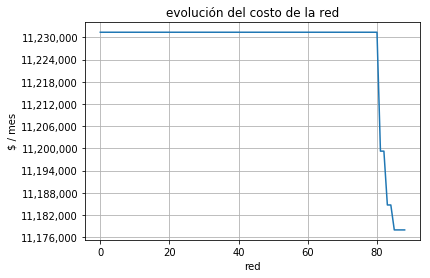

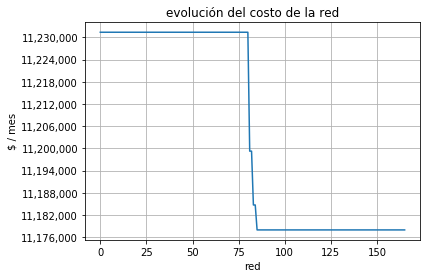

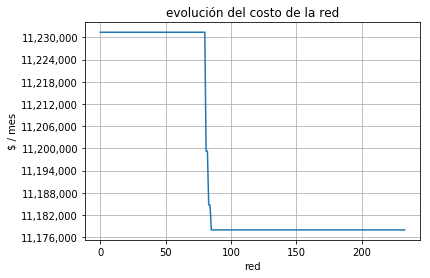

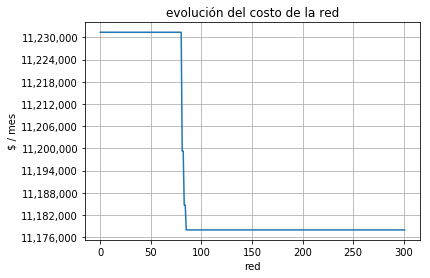

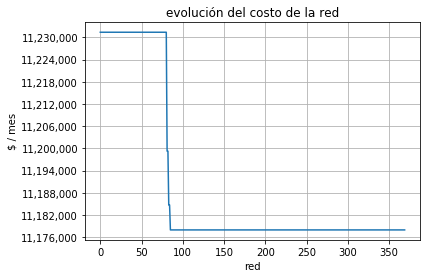

...

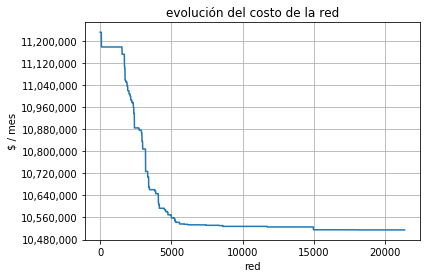

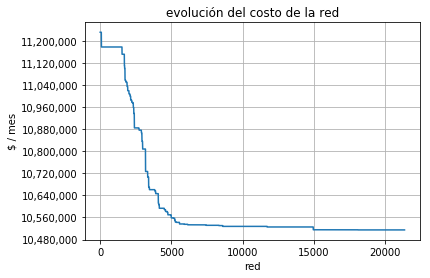

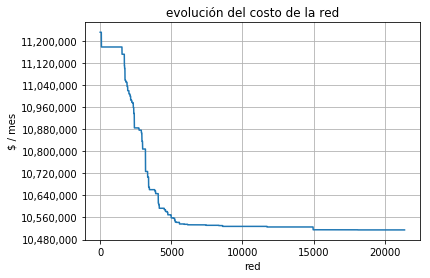

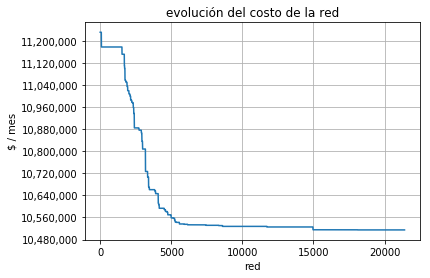

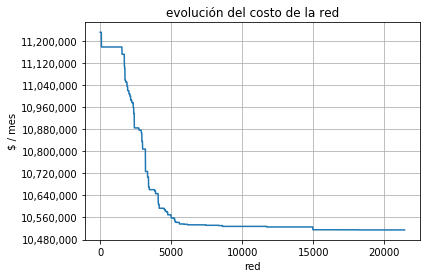

In [119]:
working_dir="../Tests/Test10/"
pathoutput = working_dir + 'output 3/'

load_data()
crec_anual_dda = 0.03
anos_futuro = 0
#nodos.at[:,'cmax_n'] = nodos.loc[:,'cmax_n'] * (1 + crec_anual_dda) ** anos_futuro
#nodos.at[:,'cpro_n'] = nodos.loc[:,'cpro_n'] * (1 + crec_anual_dda) ** anos_futuro
nodos.at[:,'cmax_n'] = nodos.loc[:,'cmax_n'] * 1
nodos.at[:,'cpro_n'] = nodos.loc[:,'cpro_n'] * 1
run()

In [ ]:
#######################

In [138]:
#### calculos de ahorros y mejoras en la solucion
capbodini,capbodfin,caplib,valorlib = bodega()
cini = int(solinicial['csol'].sum())
cfin = int(solfin['csol'].sum())
ahorroop = cini-cfin

print('capacidad total instalada en bodega - solución inicial: ' + str(capbodini) + ' KVA')
print('capacidad total instalada en bodega - solución final: ' + str(capbodfin) + ' KVA')
print('capacidad liberada en bodega: ' + str(caplib) + ' KVA')
print('valor de la capacidad liberada en bodega: ' + str(valorlib) + ' $Col')

print('costo de la solucion inicial = ' + str(cini) + ' $/mes')
print('costo de la solucion final = ' + str(cfin) + ' $/mes')
print('ahorro operativo de la solucion = ' + str(ahorroop) + ' $/mes')
print('ahorro total de la solucion = ' + str(ahorroop) + ' $/mes')


capacidad total instalada en bodega - solución inicial: 5087.5 KVA
capacidad total instalada en bodega - solución final: 6215.0 KVA
capacidad liberada en bodega: 1127.5 KVA
valor de la capacidad liberada en bodega: 73918900 $Col
costo de la solucion inicial = 11231392 $/mes
costo de la solucion final = 10514825 $/mes
ahorro operativo de la solucion = 716567 $/mes
ahorro total de la solucion = 716567 $/mes


In [96]:
working_dir="../Tests/Test10/"
load_data()
inv2=inv.copy()
inv2['faca'] = inv2.fase_t.map(str) + "-" + inv2.capa_t.map(str)
inv2 = inv2.merge(cartectraf[['cnue_t','faca']], on = 'faca',how = 'left')
totalcap = inv2['capa_t'].sum()
totalvalor = inv2['cnue_t'].sum()
precioKVAbod = int(totalvalor / totalcap)
print('valor de cada KVA en bodega = ' + str(precioKVAbod) + ' $/KVA')


valor de cada KVA en bodega = 65560 $/KVA


In [ ]:
###################################

In [38]:
sol.to_csv(pathoutput + 'sol.csv')